# RainFall Prediction

## Problem Statement

#### Build an efficient Classification Model that should predict whether it Rains Tomorrow or not, using the dataset

## Features description

#### Date---The date of observation

#### Location---The common name of the location of the weather station

#### MinTemp---The minimum temperature in degrees celsius

#### MaxTemp---The maximum temperature in degrees celsius

#### Rainfall---The amount of rainfall recorded for the day in mm

#### Evaporation---The so-called Class A pan evaporation (mm) in the 24 hours to 9am

#### Sunshine---The number of hours of bright sunshine in the day.

#### WindGustDir---The direction of the strongest wind gust in the 24 hours to midnight

#### WindGustSpeed---The speed (km/h) of the strongest wind gust in the 24 hours to midnight

#### WindDir9am---Direction of the wind at 9am

#### WindDir3pm---Direction of the wind at 3pm

#### WindSpeed9am---Wind speed (km/hr) averaged over 10 minutes prior to 9am

#### WindSpeed3pm---Wind speed (km/hr) averaged over 10 minutes prior to 3pm

#### Humidity9am---Humidity (percent) at 9am

#### Humidity3pm---Humidity (percent) at 3pm

#### Pressure9am---Atmospheric pressure (hpa) reduced to mean sea level at 9am

#### Pressure3pm---Atmospheric pressure (hpa) reduced to mean sea level at 3pm

#### Cloud9am---Fraction of sky obscured by cloud at 9am. This is measured in "oktas", which are a unit of                    eigths. It records how many eigths of the sky are obscured by cloud. A 0 measure indicates                    completely clear sky whilst an 8 indicates that it is completely overcast.

#### Cloud3pm---Fraction of sky obscured by cloud (in "oktas": eighths) at 3pm. See Cload9am for a description                of the values

#### Temp9am---Temperature (degrees C) at 9am
#### RISK_MM---The amount of next day rain in mm. Used to create response variable RainTomorrow. A kind of  measure of the "risk".

#### RainTomorrow---The target variable. Did it rain tomorrow?

#### Temp3pm---Temperature (degrees C) at 3pm

#### RainToday---Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0


In [76]:
# Importing required libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [77]:
# Importing the data

df = pd.read_csv(r"C:\Users\shinu\Downloads\Rainfall Prediction\weatherAUS.csv")

In [78]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,0.0,No
142189,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,0.0,No
142190,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,0.0,No
142191,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,0.0,No


In [79]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


In [81]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
142188,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,0.0,No
142189,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,0.0,No
142190,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,0.0,No
142191,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,0.0,No
142192,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,0.0,No


## EDA

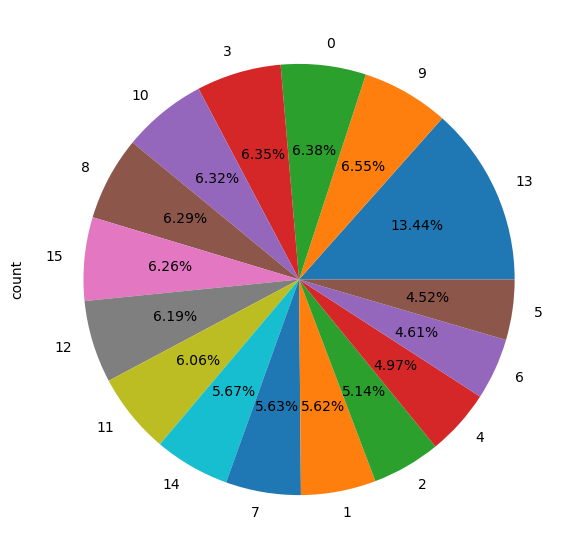

In [170]:
df['WindGustDir'].value_counts().plot(kind="pie",autopct="%.2f%%",figsize=(10,7))
plt.show()

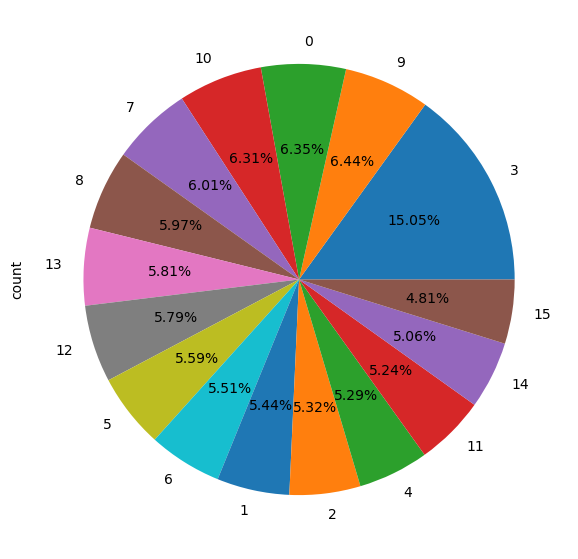

In [168]:
df['WindDir9am'].value_counts().plot(kind="pie",autopct="%.2f%%",figsize=(10,7))
plt.show()

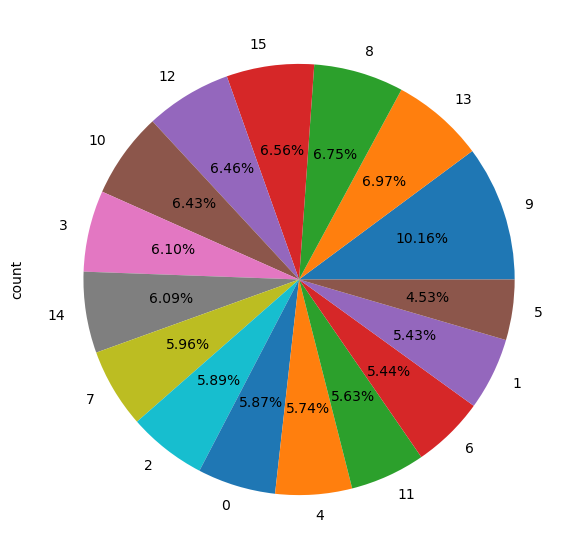

In [166]:
df['WindDir3pm'].value_counts().plot(kind="pie",autopct="%.2f%%",figsize=(10,7))
plt.show()

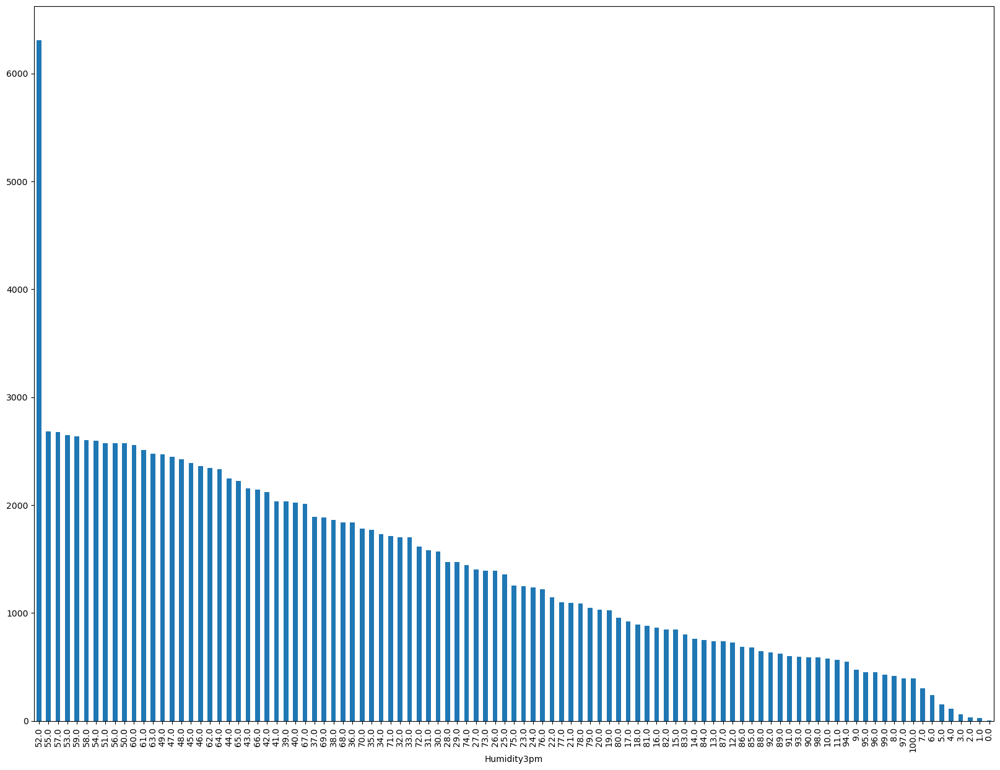

In [174]:
df['Humidity3pm'].value_counts().plot(kind="bar",figsize=(20,15))
plt.show()

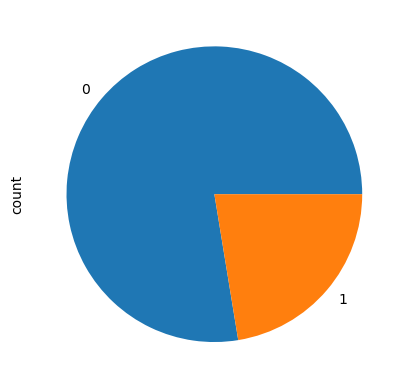

In [175]:
df['RainTomorrow'].value_counts().plot(kind="pie")
plt.show()

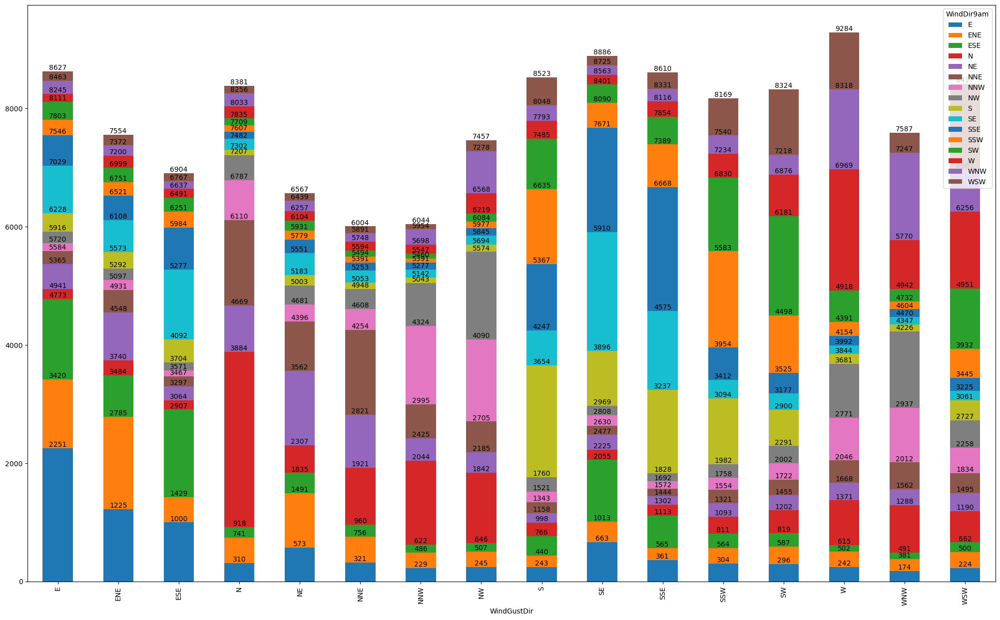

In [89]:
ax=pd.crosstab(df['WindGustDir'],df['WindDir9am']).plot(kind="bar",stacked=True,figsize = (25,15))
for i in ax.containers:
    ax.bar_label(i)

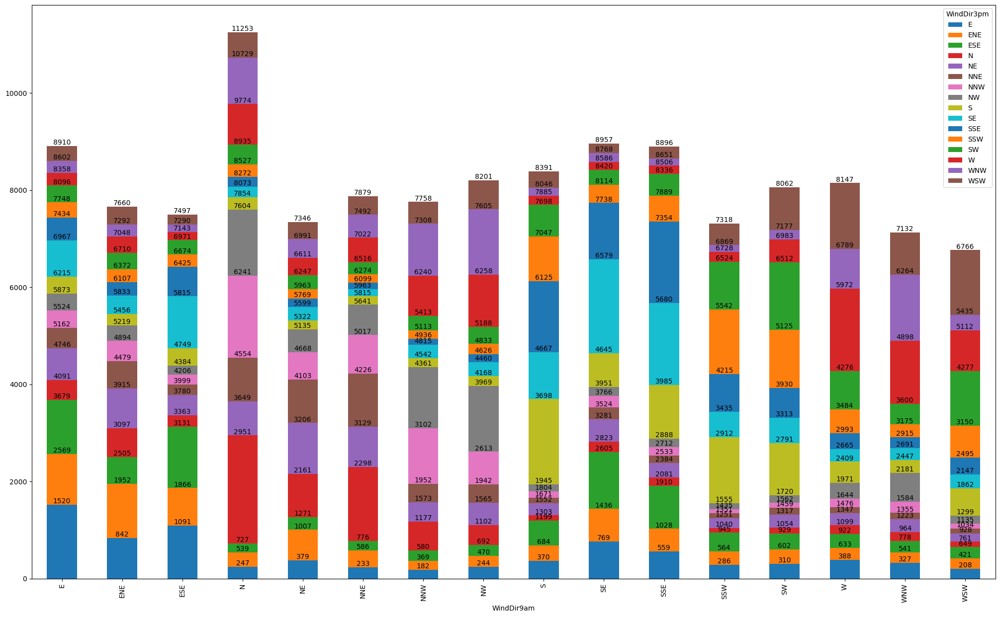

In [90]:
ax=pd.crosstab(df['WindDir9am'],df['WindDir3pm']).plot(kind="bar",stacked=True,figsize = (25,15))
for i in ax.containers:
    ax.bar_label(i)

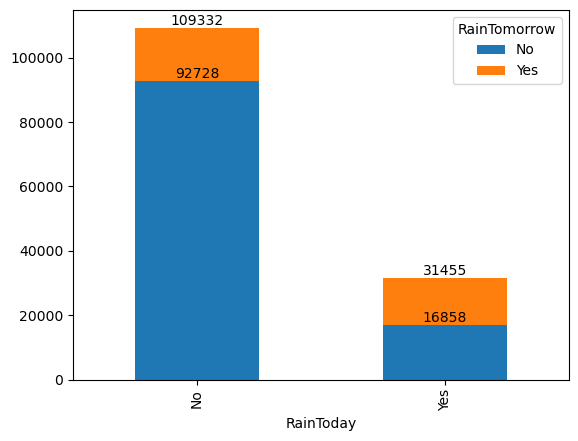

In [103]:
ax=pd.crosstab(df['RainToday'],df['RainTomorrow']).plot(kind="bar",stacked=True)
for i in ax.containers:
    ax.bar_label(i)

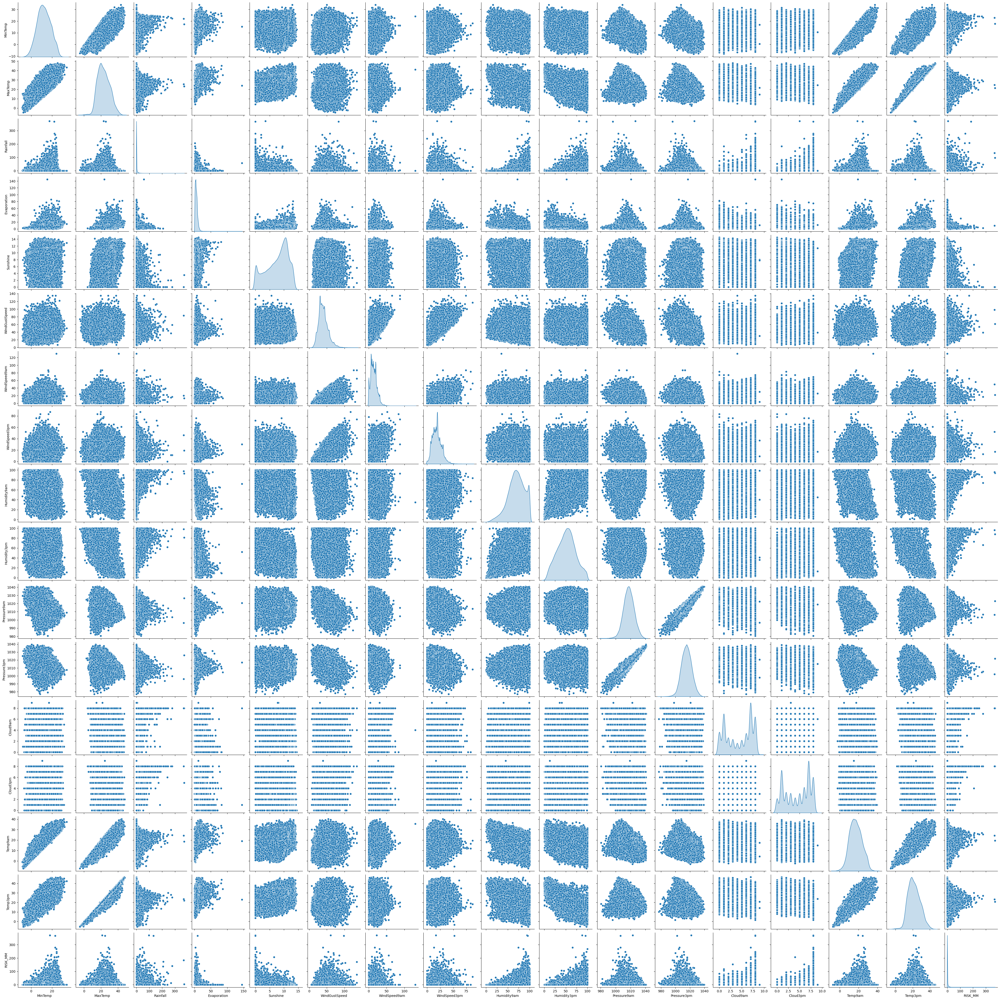

In [93]:
# Pairplot for whole data tells you the distribution for single column and that single column with all other different columns

sns.pairplot(df,diag_kind='kde')

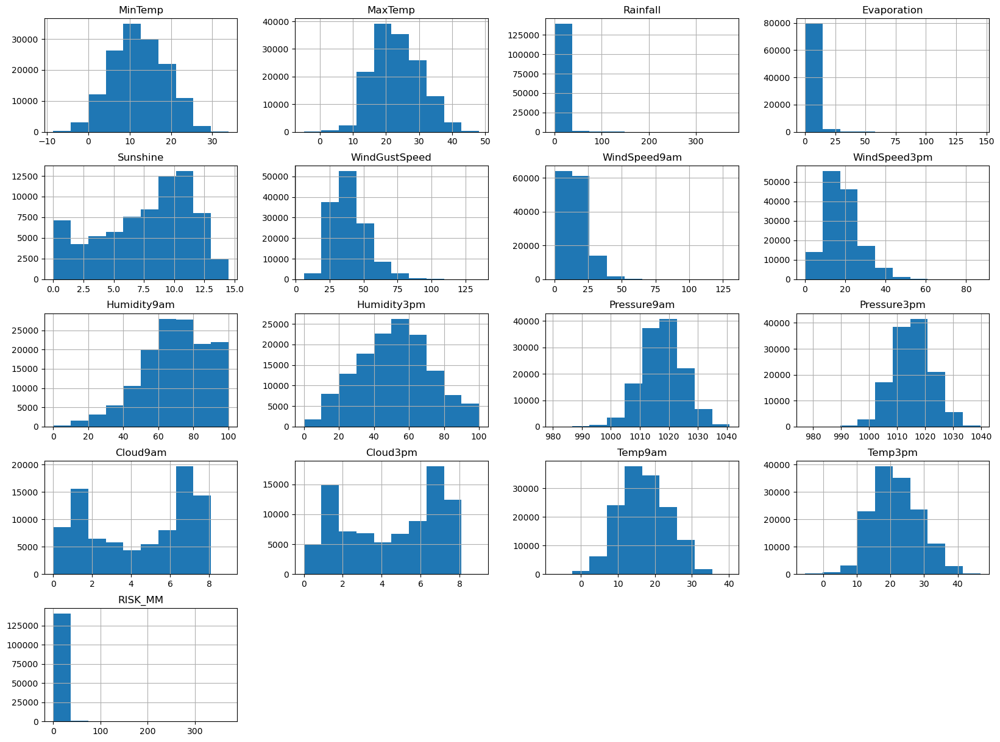

In [94]:
# Finding the distribution for each single columnb

df.hist(figsize=(20,15))
plt.show()

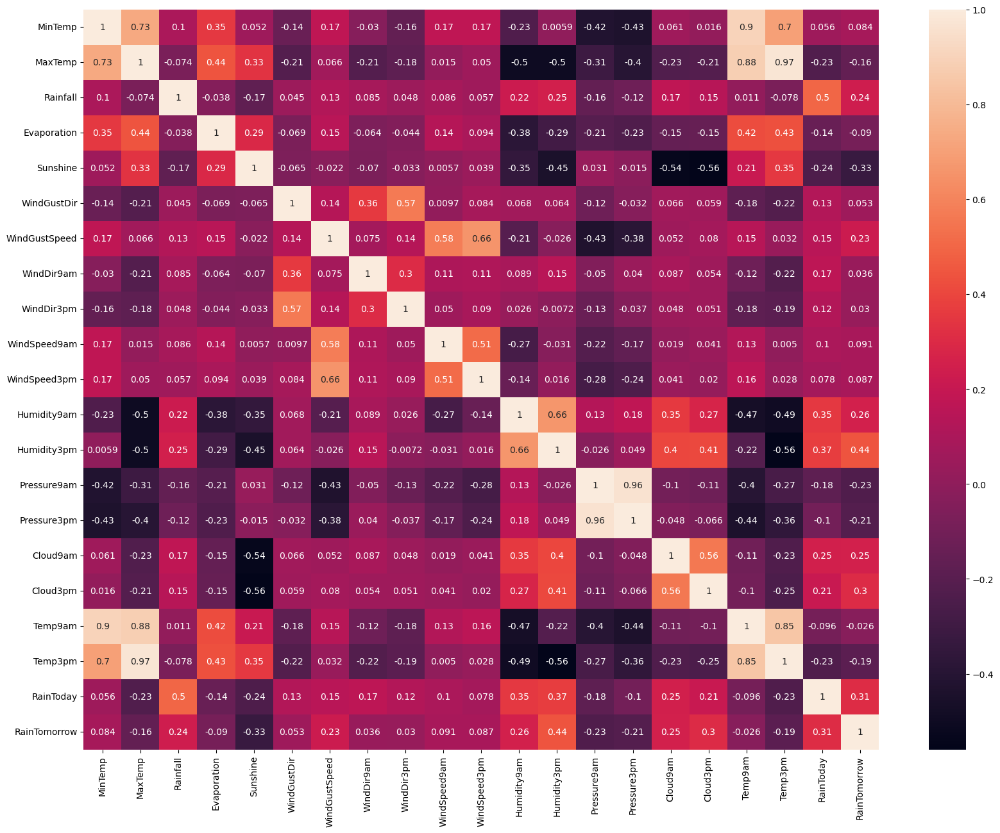

In [35]:
# Checking Correlation between two variabless using Heatmap

k=df.select_dtypes(include=['int','float'])
cor=k.corr()
plt.figure(figsize=(20,15))
sns.heatmap(cor,annot=True)
plt.show()

In [104]:
# sorting the data based on date (Time based splitting)

df = df.sort_values(by='Date')

In [105]:
#After sorting the data index's got changed to get that in order we doing reset index

df.reset_index(inplace=True)
df.drop("index",axis = 1,inplace=True)

In [106]:
#Removing unwanted features, RISK_MM is same as target label hence removing with date and loaction

df.drop(['Date', 'Location','RISK_MM'], axis=1,inplace = True)

In [108]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,8.0,24.3,0.0,3.4,6.3,NW,30.0,SW,NW,6.0,...,68.0,29.0,1019.7,1015.0,7.0,7.0,14.4,23.6,No,Yes
1,14.0,26.9,3.6,4.4,9.7,ENE,39.0,E,W,4.0,...,80.0,36.0,1012.4,1008.4,5.0,3.0,17.5,25.7,Yes,Yes
2,13.7,23.4,3.6,5.8,3.3,NW,85.0,N,NNE,6.0,...,82.0,69.0,1009.5,1007.2,8.0,7.0,15.4,20.2,Yes,Yes
3,13.3,15.5,39.8,7.2,9.1,NW,54.0,WNW,W,30.0,...,62.0,56.0,1005.5,1007.0,2.0,7.0,13.5,14.1,Yes,Yes
4,7.6,16.1,2.8,5.6,10.6,SSE,50.0,SSE,ESE,20.0,...,68.0,49.0,1018.3,1018.5,7.0,7.0,11.1,15.4,Yes,No


In [110]:
df.dtypes

MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

## Chi Square Test

In [111]:
# Both variables categorical - chi square test of independence

pd.crosstab(df['WindGustDir'],df['WindDir9am'])

WindDir9am,E,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW
WindGustDir,,,,,,,,,,,,,,,,
E,2251,1169,1353,168,424,219,136,196,312,801,517,257,308,134,218,164
ENE,1225,1560,699,256,808,383,166,195,281,535,413,230,248,201,172,182
ESE,1000,429,1478,157,233,170,104,133,388,1185,707,267,240,146,130,137
N,310,431,177,2966,785,1441,677,420,95,180,125,102,126,198,223,125
NE,573,918,344,472,1255,834,285,322,180,368,228,152,173,153,182,128
NNE,321,435,204,961,900,1433,354,340,105,200,138,103,100,154,143,113
NNW,229,257,136,1422,381,570,1329,719,99,135,114,69,87,151,256,90
NW,245,262,139,1196,343,520,1385,1484,120,151,132,107,135,349,710,179
S,243,197,326,232,160,185,178,239,1894,593,1120,1268,850,308,255,475


In [112]:
# Null-there is no association between both variables
# Alt-There is association between both variables

In [113]:
from scipy.stats import chi2_contingency
chi2_contingency(pd.crosstab(df['WindGustDir'],df['WindDir9am']))

#Since Pvalue = 0.0 Not Reject Null

Chi2ContingencyResult(statistic=110952.90285769245, pvalue=0.0, dof=225, expected_freq=array([[596.13562527, 516.63710926, 503.14645199, 752.65478147,
        484.56238332, 530.1965964 , 514.15923343, 518.01370694,
        560.89472466, 587.11891047, 602.53680448, 492.06484067,
        531.98617339, 516.29295984, 471.14055594, 449.45914248],
       [521.99009079, 452.37935822, 440.56662784, 659.04187078,
        424.29398905, 464.25235762, 450.20967304, 453.58473887,
        491.13234614, 514.09484753, 527.59511082, 430.8633136 ,
        465.81935247, 452.07801305, 412.54152771, 393.55678246],
       [477.07434298, 413.45341397, 402.65713511, 602.333211  ,
        387.78471014, 424.30477589, 411.47042397, 414.55507508,
        448.8718186 , 469.85846272, 482.19706713, 393.78876318,
        425.73693533, 413.17799869, 377.04351434, 359.69235188],
       [579.13674225, 501.90513651, 488.79916705, 731.19273484,
        470.74502545, 515.07797316, 499.49791763, 503.24248033,
        544.90

In [115]:
pd.crosstab(df['WindDir9am'],df['WindDir3pm'])

WindDir3pm,E,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW
WindDir9am,,,,,,,,,,,,,,,,
E,1520,1049,1110,412,655,416,362,349,342,752,467,314,348,262,244,308
ENE,842,1110,553,592,818,564,415,325,237,377,274,265,338,338,244,368
ESE,1091,775,1265,232,417,219,207,178,365,1066,610,249,297,172,147,207
N,247,292,188,2224,698,905,1687,1363,250,219,199,255,408,839,955,524
NE,379,628,264,890,1045,897,565,467,187,277,170,194,284,364,380,355
NNE,233,353,190,1522,831,1097,791,624,174,148,136,175,242,506,470,387
NNW,182,187,211,597,396,379,1150,1259,181,273,121,177,300,827,1068,450
NW,244,226,222,410,463,377,671,1356,199,292,166,207,355,1070,1347,596
S,370,314,515,104,249,119,133,141,1753,969,1458,922,651,187,161,345


In [116]:
chi2_contingency(pd.crosstab(df['WindDir9am'],df['WindDir3pm']))

# Since pvalue=0.0 , Not Reject Null

Chi2ContingencyResult(statistic=79917.66217942107, pvalue=0.0, dof=225, expected_freq=array([[544.49885921, 500.48719781, 549.70085963, 552.16496508,
        512.05480399, 408.90461156, 485.08653868, 533.13659515,
        627.93620797, 672.97457998, 597.61402134, 519.99469936,
        594.73923164, 643.74755134, 560.17330783, 606.78596944],
       [468.11013036, 430.27294447, 472.58233274, 474.70074439,
        440.21771028, 351.53864473, 417.03287164, 458.34189886,
        539.8419027 , 578.56176012, 513.77367042, 447.04370338,
        511.30219016, 553.43504413, 481.58558226, 521.65886935],
       [458.14904012, 421.11700583, 462.52607684, 464.59941002,
        430.85015326, 344.05812265, 408.15867346, 448.58867046,
        528.35440529, 566.25032841, 502.84088866, 437.5308935 ,
        500.42199995, 541.65829319, 471.33774285, 510.5582955 ],
       [687.68189256, 632.09679427, 694.25182642, 697.36390035,
        646.70625245, 516.43137978, 612.64633219, 673.33177387,
        793.060

## Data Preprocessing

In [117]:
#Checking for null valuess

df.isna().sum()

MinTemp            637
MaxTemp            322
Rainfall          1406
Evaporation      60843
Sunshine         67816
WindGustDir       9330
WindGustSpeed     9270
WindDir9am       10013
WindDir3pm        3778
WindSpeed9am      1348
WindSpeed3pm      2630
Humidity9am       1774
Humidity3pm       3610
Pressure9am      14014
Pressure3pm      13981
Cloud9am         53657
Cloud3pm         57094
Temp9am            904
Temp3pm           2726
RainToday         1406
RainTomorrow         0
dtype: int64

In [120]:
df.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [121]:
#Creating a list to fill the Median for numerical columns

Numerical_cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustSpeed','WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm']

In [122]:
#Filling the values and making permanent change 

for c in Numerical_cols:
    p = df[c].median()
    df[c] = df[c].fillna(p)

In [123]:
##Creating a list to fill the Mean for categorical columns


Categorical_cols = ["WindGustDir","WindDir9am","WindDir3pm","RainToday"]

In [124]:
#Filling the values and making permanent change 


for x in Categorical_cols:
    q = df[x].mode()[0]
    df[x] = df[x].fillna(q)

In [125]:
df.dtypes

MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

## Encoding

In [126]:
import warnings
warnings.filterwarnings("ignore")

In [127]:
#After EDA we having some categorical columns i.e., WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow 


#For Rain Tomorrow column we use LabelEncoder
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["RainTomorrow"] = le.fit_transform(df[["RainTomorrow"]])


from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["WindGustDir"] = le.fit_transform(df[["WindGustDir"]])


from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["WindDir9am"] = le.fit_transform(df[["WindDir9am"]])



from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["WindDir3pm"] = le.fit_transform(df[["WindDir3pm"]])


from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["RainToday"] = le.fit_transform(df[["RainToday"]])

In [128]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,8.0,24.3,0.0,3.4,6.3,7,30.0,12,7,6.0,...,68.0,29.0,1019.7,1015.0,7.0,7.0,14.4,23.6,0,1
1,14.0,26.9,3.6,4.4,9.7,1,39.0,0,13,4.0,...,80.0,36.0,1012.4,1008.4,5.0,3.0,17.5,25.7,1,1
2,13.7,23.4,3.6,5.8,3.3,7,85.0,3,5,6.0,...,82.0,69.0,1009.5,1007.2,8.0,7.0,15.4,20.2,1,1
3,13.3,15.5,39.8,7.2,9.1,7,54.0,14,13,30.0,...,62.0,56.0,1005.5,1007.0,2.0,7.0,13.5,14.1,1,1
4,7.6,16.1,2.8,5.6,10.6,10,50.0,10,2,20.0,...,68.0,49.0,1018.3,1018.5,7.0,7.0,11.1,15.4,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,-0.1,12.7,0.0,4.8,8.5,11,19.0,11,10,2.0,...,92.0,54.0,1020.8,1018.5,8.0,8.0,4.0,10.7,0,0
142189,7.6,19.3,0.0,3.4,9.4,13,35.0,13,13,13.0,...,73.0,32.0,1018.6,1015.4,1.0,1.0,9.4,18.8,0,0
142190,2.7,20.0,0.2,4.8,8.5,13,37.0,3,14,0.0,...,88.0,35.0,1018.8,1015.2,5.0,5.0,9.6,19.4,0,0
142191,3.1,20.0,0.0,4.8,8.5,12,28.0,9,8,2.0,...,95.0,45.0,1017.6,1015.2,5.0,5.0,7.8,17.8,0,0


## Splitting the data

In [129]:
X = df.drop("RainTomorrow",axis = 1)
Y = df["RainTomorrow"]

In [130]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.30)

## Model Building

In [131]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier  

## Logistic Regression

In [132]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(X,Y)
lr.score(X,Y)

0.838318341971827

In [133]:
from sklearn.model_selection import cross_val_score
cv=cross_val_score(lr,X,Y)
print(cv)
print()
print(cv.mean())

[0.84310278 0.83835578 0.84292697 0.8320557  0.83497433]

0.8382831114316976


### Model Evaluation

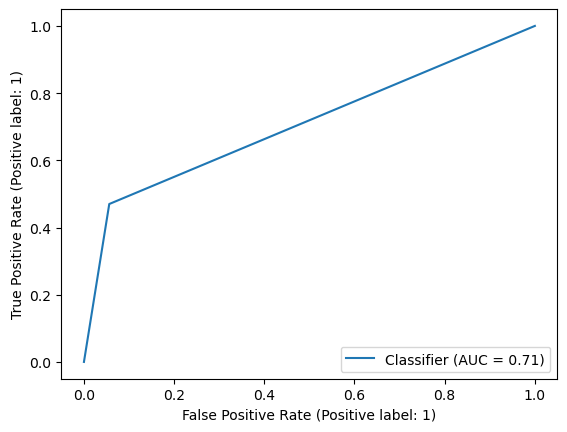

In [135]:
RocCurveDisplay.from_predictions(Y_test,lr_pred)
plt.show()

In [136]:
from sklearn.metrics import confusion_matrix,classification_report,f1_score,RocCurveDisplay
lr_pred = lr.predict(X_test)


In [137]:
print(confusion_matrix(Y_test,lr_pred))

[[31256  1859]
 [ 5058  4485]]


In [138]:
print(classification_report(Y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.86      0.94      0.90     33115
           1       0.71      0.47      0.56      9543

    accuracy                           0.84     42658
   macro avg       0.78      0.71      0.73     42658
weighted avg       0.83      0.84      0.83     42658



## DecisionTree Classifier

In [141]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(max_depth=10)
dt.fit(X,Y)
dt.score(X,Y)


0.8600423368238943

In [142]:
cv1=cross_val_score(dt,X,Y)
print(cv1)
print()
print(cv1.mean())

[0.8371954  0.83431204 0.83902388 0.83328645 0.83170406]

0.8351043636590996


### Model Evaluation

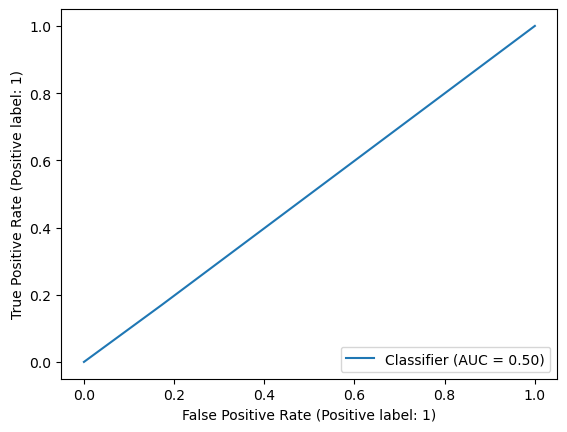

In [143]:
RocCurveDisplay.from_predictions(Y_test,dt_pred)
plt.show()

In [144]:
from sklearn.metrics import confusion_matrix,classification_report
dt_pred = dt.predict(X_test)

In [145]:
print(confusion_matrix(Y_test,dt_pred))

[[31620  1495]
 [ 4460  5083]]


In [146]:
print(classification_report(Y_test,dt_pred))

              precision    recall  f1-score   support

           0       0.88      0.95      0.91     33115
           1       0.77      0.53      0.63      9543

    accuracy                           0.86     42658
   macro avg       0.82      0.74      0.77     42658
weighted avg       0.85      0.86      0.85     42658



## Random forest Classifier

In [147]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(max_depth=10)
rfc.fit(X,Y)
rfc.score(X,Y)

0.8631718860984718

In [148]:
cv2=cross_val_score(rfc,X,Y)
print(cv2)
print()
print(cv2.mean())

[0.84988924 0.8483069  0.8508738  0.84028413 0.84123356]

0.8461175253538282


### Model Evaluation

In [149]:
from sklearn.metrics import confusion_matrix,classification_report
rfc_pred = rfc.predict(X_test)

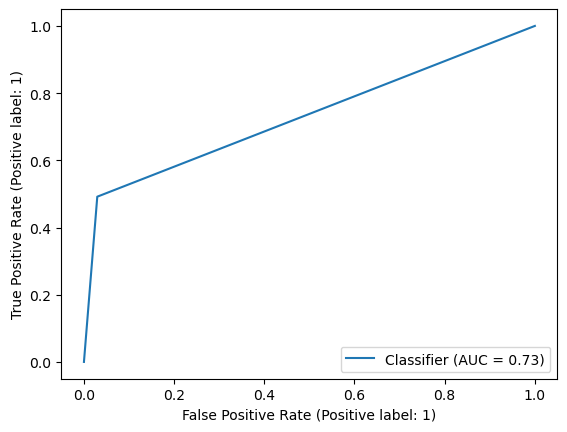

In [150]:
RocCurveDisplay.from_predictions(Y_test,rfc_pred)
plt.show()

In [151]:
print(confusion_matrix(Y_test,rfc_pred))

[[32136   979]
 [ 4850  4693]]


In [152]:
print(classification_report(Y_test,rfc_pred))

              precision    recall  f1-score   support

           0       0.87      0.97      0.92     33115
           1       0.83      0.49      0.62      9543

    accuracy                           0.86     42658
   macro avg       0.85      0.73      0.77     42658
weighted avg       0.86      0.86      0.85     42658



## GradientBoosting Classifier

In [153]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier()
gbc.fit(X,Y)
gbc.score(X,Y)

0.8495636212753089

In [154]:
cv3=cross_val_score(gbc,X,Y)
print(cv3)
print()
print(cv3.mean())

[0.84967826 0.84851788 0.85206934 0.84225332 0.84288628]

0.8470810164886384


### Model Evaluation

In [159]:
from sklearn.metrics import confusion_matrix,classification_report
gbc_pred = gbc.predict(X_test)

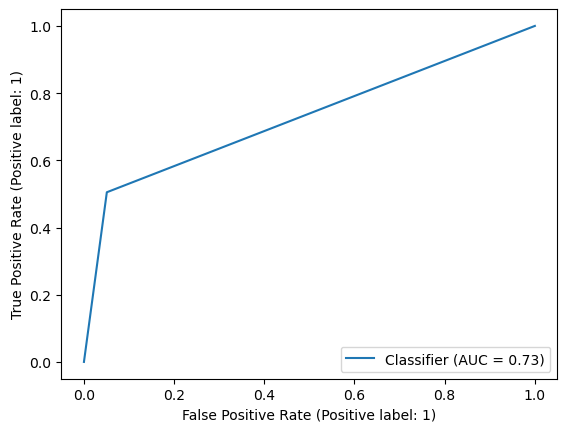

In [160]:
RocCurveDisplay.from_predictions(Y_test,gbc_pred)
plt.show()

In [161]:
print(confusion_matrix(Y_test,gbc_pred))

[[31434  1681]
 [ 4724  4819]]


In [162]:
print(classification_report(Y_test,gbc_pred))

              precision    recall  f1-score   support

           0       0.87      0.95      0.91     33115
           1       0.74      0.50      0.60      9543

    accuracy                           0.85     42658
   macro avg       0.81      0.73      0.75     42658
weighted avg       0.84      0.85      0.84     42658



## XGBClassifier

In [163]:
from xgboost import XGBClassifier
xg = XGBClassifier()
xg.fit(X,Y)
xg.score(X,Y)

0.8796846539562426

### Model Evaluation

In [164]:
xg_pred = xg.predict(X_test)

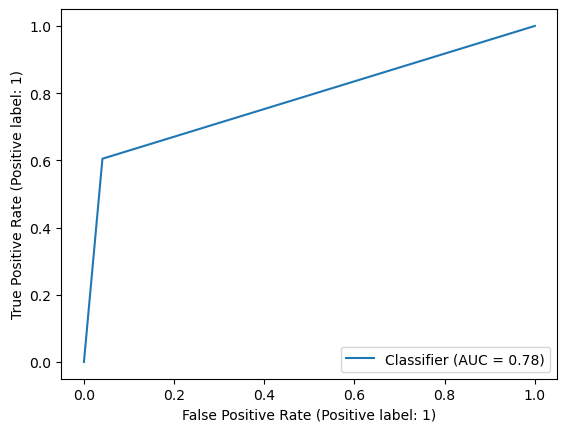

In [165]:
RocCurveDisplay.from_predictions(Y_test,xg_pred)
plt.show()

## Results and Conclusion:
        
#### Best Models in terms of accuracy (In my Experiment):

#### 1) XG Boost Model
#### 4) Decision Tree Classifier
#### 5) Gradient Boost Classifier

### Best Models in terms of Computation Time (In my Experiment):

#### 1) Logistic Regression
#### 2) Decisoin Tree Classifier
#### 3) XG Boost Model


## Conclusion:

### The Ensemble model XG Boost is performing well when compared with Other models like Logistic Regression,Random Forest,Decision Tree and GradientBoost. But XG Boost model consumes more time to train the model.
